# Introduction

In this tutorial, we demonstrate how to use SIMVI to reveal the intrinsic variation, spatial variation as well as spatial effect in the MERFISH MTG data. 

# 0. Loading packages and data

In [1]:
import scanpy as sc
import squidpy as sq

import numpy as np
import pandas as pd

In [2]:
adata = sc.read("/gpfs/gibbs/pi/zhao/tl688/seqfishdata/data/Mouse_brain/gimvigat_mb_all600.h5ad")
adata

AnnData object with n_obs × n_vars = 4628 × 16907
    obs: 'n_counts', 'Class', 'names', 'ind_x', '_scvi_batch', '_scvi_labels', '_scvi_ind_x'
    var: 'GeneName', 'gene_count_corr'
    obsm: 'imputed', 'imputed_raw', 'imputed_raw_theta'
    layers: 'spliced', 'unspliced'

In [3]:
adata_raw = sc.read("/gpfs/gibbs/pi/zhao/tl688/seqfishdata/data/Mouse_brain/HybISS_celltype.h5ad")

In [4]:
adata_raw 

AnnData object with n_obs × n_vars = 4628 × 119
    obs: 'n_counts', 'Class'
    var: 'GeneName'
    obsm: 'X_xy_loc', 'xy_loc'

In [5]:
from simvi.model import SimVI

Global seed set to 0


In [6]:
adata.obsm['spatial'] = adata_raw.obsm['X_xy_loc'] 

# 1. SIMVI model setup and training

First the edge index is created through the default function in SIMVI, Then the SIMVI model is trained for 300 epochs. The loss curves for both training loss (Blue) and validation loss (Orange) are plotted.

In [7]:
SimVI.setup_anndata(adata)
edge_index = SimVI.extract_edge_index(adata,n_neighbors=10)
model = SimVI(adata,kl_weight=1,kl_gatweight=1,lam_mi=5)
train_loss, val_loss = model.train(edge_index,max_epochs=300)

No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)
/gpfs/gibbs/project/zhao/tl688/conda_envs/simvi/lib/python3.8/site-packages/scvi/data/fields/_layer_field.py:78: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  warnings.warn(
/gpfs/gibbs/project/zhao/tl688/conda_envs/simvi/lib/python3.8/site-packages/scvi/model/_utils.py:266: UserWarning: This dataset has some empty cells, this might fail inference.Data should be filtered with `scanpy.pp.filter_cells()`
  warnings.warn(
  0%|          | 0/300 [00:00<?, ?it/s]/gpfs/gibbs/project/zhao/tl688/conda_envs/simvi/lib/python3.8/site-packages/scvi/distributions/_negative_binomial.py:436: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
Epoch 300/300: 100%|██████████| 300/300 [1:09:20<00:00, 13.87s/it, train_loss=8520.016, val_loss=8611.528] 


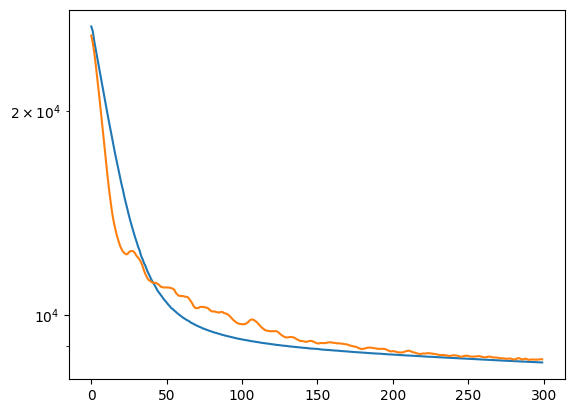

In [8]:
import matplotlib.pyplot as plt
plt.plot(train_loss)
plt.plot(val_loss)
plt.yscale('log')

# 2. Downstream analysis with SIMVI

First, we show the UMAP visualization for the original count matrix under standard Scanpy preprocessing pipeline. In the original embedding, we see there are various subclusters within a number of cell types. Moreover, visualization of MYH11 (indicating the vascular structure) shows it is enriched in certain sbuclusters in endothelial cells and mural cells.

In [9]:
adata

AnnData object with n_obs × n_vars = 4628 × 16907
    obs: 'n_counts', 'Class', 'names', 'ind_x', '_scvi_batch', '_scvi_labels', '_scvi_ind_x'
    var: 'GeneName', 'gene_count_corr'
    uns: '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'imputed', 'imputed_raw', 'imputed_raw_theta', 'spatial'
    layers: 'spliced', 'unspliced'

In [10]:
import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 300
plt.rcParams["font.size"] =18
sc.pp.normalize_total(adata)
sc.pp.highly_variable_genes(adata)
adata = adata[:, adata.var['highly_variable']]
sc.pp.log1p(adata)
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
# sc.pl.umap(adata,color=['cluster_L1','MYH11'],wspace=0.35)

/gpfs/gibbs/project/zhao/tl688/conda_envs/simvi/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:196: UserWarning: Some cells have zero counts
  warn(UserWarning('Some cells have zero counts'))
/gpfs/gibbs/project/zhao/tl688/conda_envs/simvi/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:372: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


/gpfs/gibbs/project/zhao/tl688/conda_envs/simvi/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


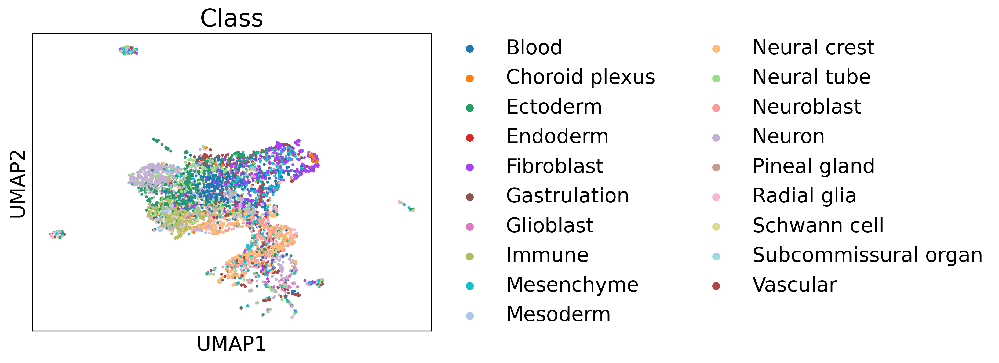

In [11]:
sc.pl.umap(adata,color=['Class'],wspace=0.35)

/gpfs/gibbs/project/zhao/tl688/conda_envs/simvi/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


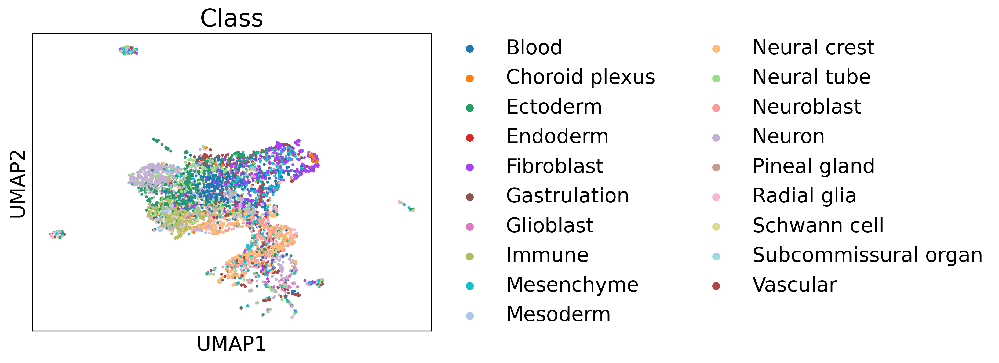

In [14]:
sc.pl.umap(adata,color=['Class'],wspace=0.35)

In this step we put back the raw count in adata.X to match the SIMVI input.

/gpfs/gibbs/project/zhao/tl688/conda_envs/simvi/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


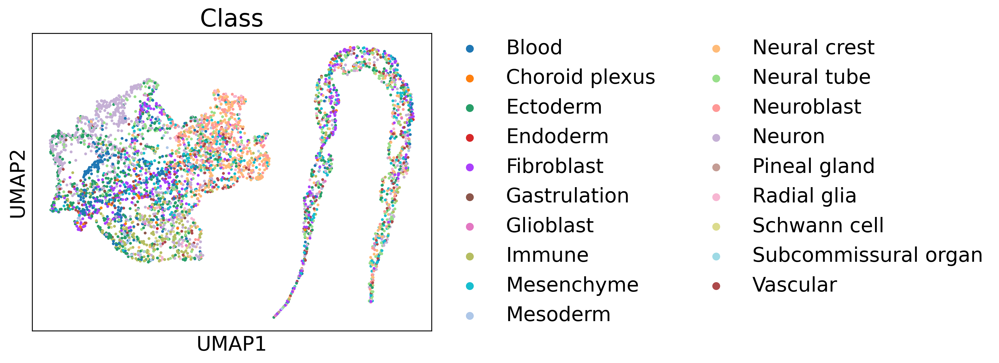

In [17]:
sc.pl.umap(adata,color=['Class'],wspace=0.3,save='merfish_intrinsic.pdf')

By visualization of the SIMVI intrinsic embedding, we can see the subclusters are merged according to cell type variation. The expression of MYH11 now is "dispersed" in the cluster of endothelial and mural cells, meaning the learned intrinsic variation removes the spatial effect associated with the vascular structure. 

/gpfs/gibbs/project/zhao/tl688/conda_envs/simvi/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


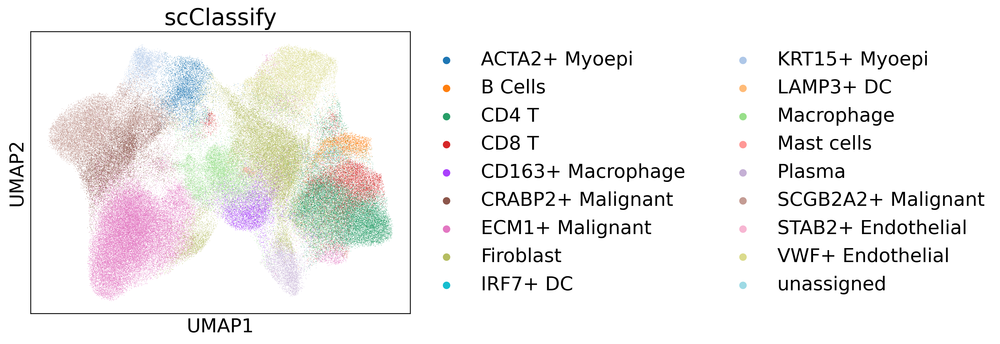

In [13]:
a = model.get_latent_representation(edge_index,representation_kind='intrinsic')
adata.obsm['simvi'] = a
sc.pp.neighbors(adata,use_rep='simvi')
sc.tl.umap(adata)
sc.pl.umap(adata,color=['scClassify'],wspace=0.3,save='merfish_intrinsic.pdf')

/gpfs/gibbs/project/zhao/tl688/conda_envs/simvi/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


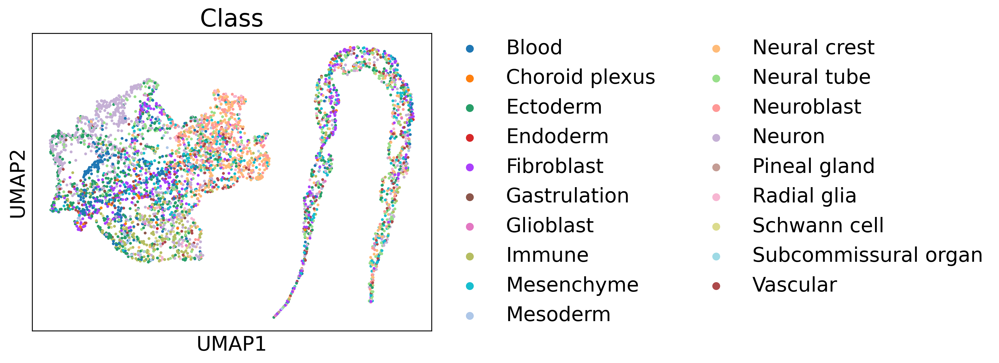

In [18]:
a = model.get_latent_representation(edge_index,representation_kind='interaction')
adata.obsm['simvi_interact'] = a
sc.pp.neighbors(adata,use_rep='simvi_interact')
sc.tl.umap(adata)
sc.pl.umap(adata,color=['Class'],save='mousebrainhybiss_interact.pdf')

/gpfs/gibbs/project/zhao/tl688/conda_envs/simvi/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:196: UserWarning: Some cells have zero counts
  warn(UserWarning('Some cells have zero counts'))


/gpfs/gibbs/project/zhao/tl688/conda_envs/simvi/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


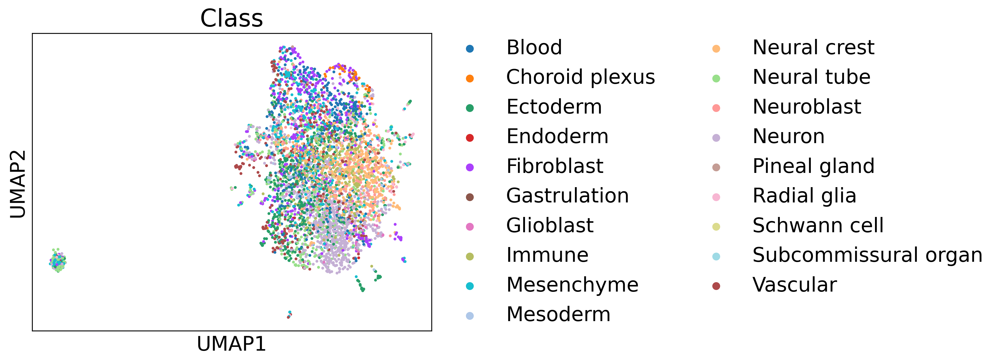

In [21]:
a = model.get_spatial_effect(edge_index,n_neighbors = 50)
adata = sc.read("/gpfs/gibbs/pi/zhao/tl688/seqfishdata/data/Mouse_brain/gimvigat_mb_all600.h5ad")
adata_ = adata.copy()
adata_.X = a
sc.pp.pca(adata_)
sc.pp.neighbors(adata_)
sc.tl.leiden(adata_,resolution=0.4) ## You can play with the clustering parameter!
sc.tl.umap(adata_)
sc.pl.umap(adata_,color=['Class'],wspace=0.3,save='mousebrainhybiss_spatialeffect.pdf')

/gpfs/gibbs/project/zhao/tl688/conda_envs/simvi/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:196: UserWarning: Some cells have zero counts
  warn(UserWarning('Some cells have zero counts'))


/gpfs/gibbs/project/zhao/tl688/conda_envs/simvi/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


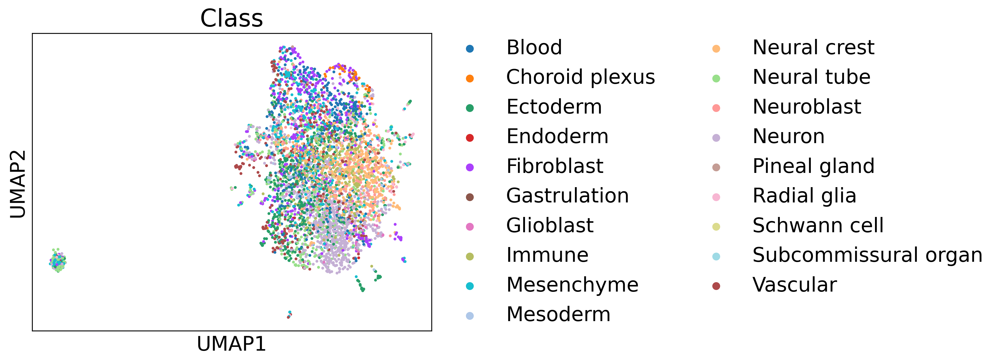

In [12]:
a = model.get_spatial_effect(edge_index,n_neighbors = 50)
adata = sc.read("/gpfs/gibbs/pi/zhao/tl688/seqfishdata/data/Mouse_brain/gimvigat_mb_all600.h5ad")
adata_ = adata.copy()
adata_.X = a
sc.pp.pca(adata_)
sc.pp.neighbors(adata_)
sc.tl.leiden(adata_,resolution=0.4) ## You can play with the clustering parameter!
sc.tl.umap(adata_)
sc.pl.umap(adata_,color=['Class'],wspace=0.3,save='mousebrainhybiss_spatialeffect.pdf')

In [15]:
sc.pp.normalize_total(adata)
sc.pp.highly_variable_genes(adata)
adata = adata[:, adata.var['highly_variable']]
sc.pp.log1p(adata)

/gpfs/gibbs/project/zhao/tl688/conda_envs/simvi/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:196: UserWarning: Some cells have zero counts
  warn(UserWarning('Some cells have zero counts'))
/gpfs/gibbs/project/zhao/tl688/conda_envs/simvi/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:372: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [18]:
sc.tl.rank_genes_groups(adata, groupby='Class', method = 'wilcoxon')

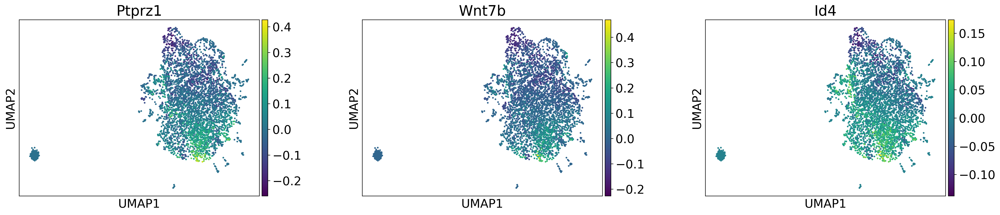

In [22]:
sc.pl.umap(adata_,color=['Ptprz1','Wnt7b','Id4'],wspace=0.3,save='mousebrainhybiss_spatialeffect_neuron.pdf')

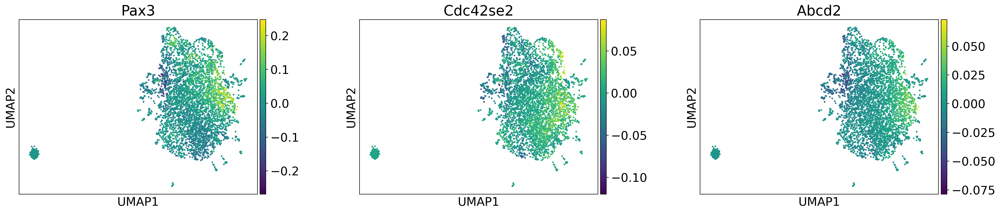

In [25]:
sc.pl.umap(adata_,color=['Pax3', 'Cdc42se2', 'Abcd2'],wspace=0.3,save='mousebrainhybiss_spatialeffect_neuralcrest.pdf')